# Logistic Function

## Introduction

The logistic function, also known as the sigmoid function, is a mathematical function that maps any real number to a value between 0 and 1. It is widely used in machine learning, statistics, and biology for modeling probabilities, activation functions in neural networks, and processes with S-shaped growth curves. Its smooth, S-shaped curve makes it ideal for representing transitions or probabilities.

Here, we also use PsyNeuLink to introduce basic functionality.

**Setup:**


In [2]:
%%capture
!pip install psyneulink

import psyneulink as pnl

We can use PsyNeuLink to plot the default logistic function:

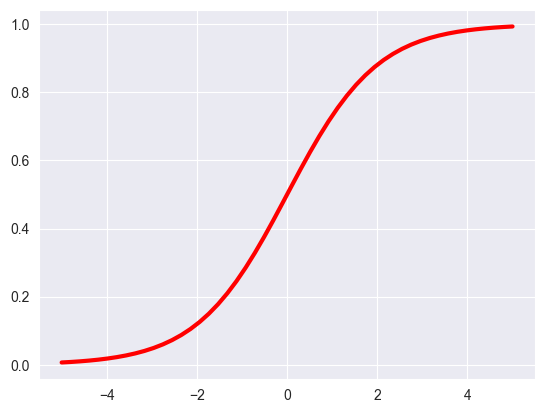

In [5]:
logistic_transfer = pnl.TransferMechanism(function=pnl.Logistic())
logistic_transfer.plot()

In the cell below you can plug a single number into this function and get an output value. Your input corresponds to a point on the x-axis, and the output is the corresponding y-value (height of the point on the curve above the x you specified).

In [8]:
logistic_transfer.execute(-2)   # Try other inputs! What do you expect when you input 0?

array([[0.11920292]])

## Gain, Offset, and Bias

The general logistic function has the following mathematical form:

$$
f(x) = \frac{1}{1 + e^{-gain * (x - bias)}} + offset
$$

The gain determines how steep the central portion of the S curve is, with higher values being steeper.

In [118]:
from IPython.display import IFrame

url = "https://younesstrittmatter.github.io/502B/_static/html_widgets/interactive_logistic.html"
IFrame(src=url, width="100%", height="800px")

In [114]:
# !pip install plotly
# import plotly.graph_objects as go
# import numpy as np
# 
# # Function to generate a logistic function
# def generate_logistic_function(x, gain=1, bias=0, offset=0):
#     return 1 / (1 + np.exp(-gain * (x - bias))) + offset
# 
# # Initial parameters and data
# x = np.linspace(-10, 10, 500)
# initial_gain, initial_bias, initial_offset = 1.0, 0.0, 0.0
# y = generate_logistic_function(x, gain=initial_gain, bias=initial_bias, offset=initial_offset)
# 
# # Create figure
# fig = go.Figure()
# 
# # Add the logistic function
# fig.add_trace(
#     go.Scatter(
#         x=x,
#         y=y,
#         mode="lines",
#         name="Logistic Function",
#     )
# )
# 
# # Generate slider steps
# gain_values = np.round(np.linspace(-5, 5, 101), 2)
# bias_values = np.round(np.linspace(-5, 5, 101), 2)
# offset_values = np.round(np.linspace(-5, 5, 101), 2)
# 
# gain_initial_index = np.where(gain_values == initial_gain)[0][0]
# bias_initial_index = np.where(bias_values == initial_bias)[0][0]
# offset_initial_index = np.where(offset_values == initial_offset)[0][0]
# 
# # Define sliders for Gain, Bias, and Offset
# sliders = [
#     dict(
#         active=gain_initial_index,
#         currentvalue={"prefix": "Gain: ", "font": {"size": 12}},  # Show current value only
#         pad={"t": 80},
#         steps=[
#             dict(
#                 method="update",
#                 args=[
#                     {"y": [generate_logistic_function(x, gain=g, bias=initial_bias, offset=initial_offset)]},
#                     {"title": f"Logistic Function (gain={g:.2f}, bias={initial_bias:.2f}, offset={initial_offset:.2f})"},
#                 ],
#                 label=f"{g:.2f}"
#             )
#             for g in gain_values
#         ],
#     ),
#     dict(
#         active=bias_initial_index,
#         currentvalue={"prefix": "Bias: ", "font": {"size": 12}}, # Show current value only
#         pad={"t": 160},
#         steps=[
#             dict(
#                 method="update",
#                 args=[
#                     {"y": [generate_logistic_function(x, gain=initial_gain, bias=b, offset=initial_offset)]},
#                     {"title": f"Logistic Function (gain={initial_gain:.2f}, bias={b:.2f}, offset={initial_offset:.2f})"},
#                 ],
#                 label=f"{b:.2f}"
#             )
#             for b in bias_values
#         ],
#     ),
#     dict(
#         active=offset_initial_index,
#         currentvalue={"prefix": "Offset: ", "font": {"size": 12}}, # Show current value only
#         pad={"t": 240},
#         steps=[
#             dict(
#                 method="update",
#                 args=[
#                     {"y": [generate_logistic_function(x, gain=initial_gain, bias=initial_bias, offset=o)]},
#                     {"title": f"Logistic Function (gain={initial_gain:.2f}, bias={initial_bias:.2f}, offset={o:.2f})"},
#                 ],
#                 label=f"{o:.2f}"
#             )
#             for o in offset_values
#         ],
#     ),
# ]
# 
# # Update layout with compact sliders
# fig.update_layout(
#     sliders=sliders,
#     title="Interactive Logistic Function",
#     xaxis_title="x",
#     yaxis_title="y",
#     margin={"t": 50, "b": 100},  # Adjust margins to fit sliders
#     width=600,  # Set plot width
#     height=800,  # Set plot height
# )
# 
# # Display the plot
# fig.show()



[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [116]:
import plotly.graph_objects as go
import numpy as np
import plotly.io as pio

from IPython.display import display, HTML

# Function to generate sine wave data
def generate_sine_wave(freq):
    x = np.linspace(0, 2 * np.pi, 500)
    y = np.sin(x * freq)
    return x, y

# Create initial data
freq = 1.0
x, y = generate_sine_wave(freq)

# Create Plotly figure
fig = go.Figure()

# Add the sine wave
fig.add_trace(go.Scatter(x=x, y=y, mode='lines', name=f'Sine Wave (freq={freq})'))

# Add slider for frequency adjustment
steps = []
for i in np.arange(1.0, 10.5, 0.5):  # Frequency from 1.0 to 10.0 in steps of 0.5
    x, y = generate_sine_wave(i)
    step = dict(
        method="update",
        args=[{"x": [x], "y": [y]}, {"title": f"Sine Wave with Frequency {i}"}],
        label=f"{i}",
    )
    steps.append(step)

# Add sliders to the layout
sliders = [dict(
    active=0,
    currentvalue={"prefix": "Frequency: "},
    pad={"t": 50},
    steps=steps
)]

# Update layout with slider
fig.update_layout(
    sliders=sliders,
    title="Interactive Sine Wave",
    xaxis_title="x",
    yaxis_title="sin(x * freq)",
)

html = fig.to_html(full_html=False)

# Display the HTML using IPython
HTML('')

<iframe src="interactive_sine_wave.html" width="800" height="600"></iframe>
